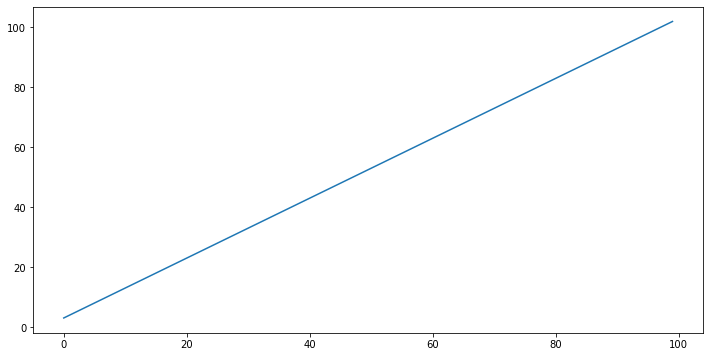

array([  3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,  14,  15,
        16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,  27,  28,
        29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  41,
        42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,  53,  54,
        55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,  66,  67,
        68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,  79,  80,
        81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,  92,  93,
        94,  95,  96,  97,  98,  99, 100, 101, 102])

In [1]:
##lineAndRandomPoints
import numpy as np
import matplotlib.pyplot as plt

line = np.array([i + 3 for i in range(100)])
figure = plt.figure(figsize = (12,6))
plt.plot(line)
plt.show()
line

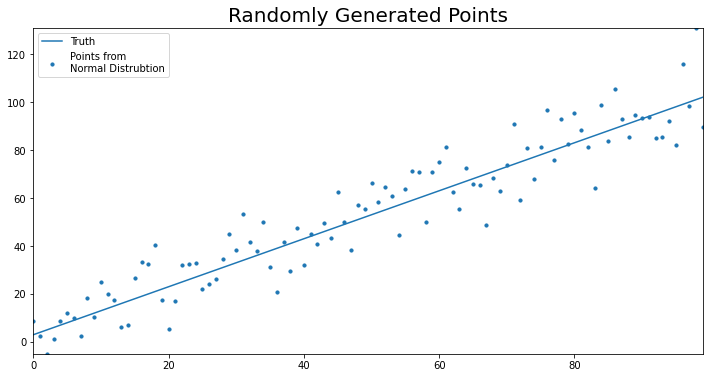

In [2]:
import random

points = []
for point in line:
    points.append(random.normalvariate(point, 10))

figure = plt.figure(figsize = (12, 6))
plt.rcParams["axes.xmargin"] = 0
plt.rcParams["axes.ymargin"] = 0
plt.plot(line, label ="Truth")
plt.scatter(np.arange(len(points)), points, s = 10,
           label = "Points from\nNormal Distrubtion")
plt.title("Randomly Generated Points", fontsize = 20)
plt.legend(loc = "best")
plt.show()

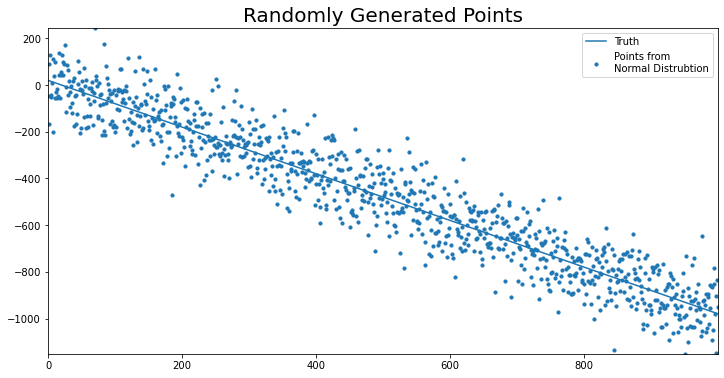

In [3]:
import random

def build_random_data_with_line(y_int, slope, SD = 1, line_length = 100):
    line = np.array([slope * i + y_int for i in range(line_length)])    
    points = []
    for point in line:
        points.append(random.normalvariate(point, SD))
        
    return line, points

def plot_line(line, points, line_name = "Truth",
              title = "Randomly Generated Points"):

    figure = plt.figure(figsize = (12, 6))
    plt.rcParams["axes.xmargin"] = 0
    plt.rcParams["axes.ymargin"] = 0
    plt.plot(line, label =line_name)
    plt.scatter(np.arange(len(points)), points, s = 10,
               label = "Points from\nNormal Distrubtion")
    plt.title("Randomly Generated Points", fontsize = 20)
    plt.legend(loc = "best")
    plt.show()
    
line, points = build_random_data_with_line(y_int = 20, slope = -1, SD = 100, line_length = 1000)
plot_line(line, points)

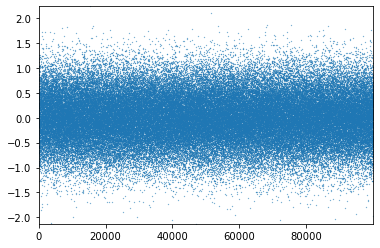

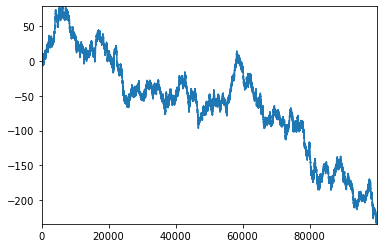

In [4]:
#montecarloSimulation

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random


mu = 0
#SD is sigma, variance is sigma**2
sigma = .5
random_list = []
observations = 100000
for i in range(100000):
    random_list.append(random.normalvariate(mu, sigma))

plt.plot(random_list, ls = "",linewidth = 1, marker =".", markersize = .5)
plt.show()
plt.close()

simulation = [] 

for i in range(len(random_list)):
    val = random_list[i]
    if i == 0:
        simulation.append(val)
    else:
        simulation.append(simulation[i-1] + val)
        
plt.plot(simulation)
plt.show()
plt.close()



In [5]:
def run_monte_carlo(mean, sigma, num_sims, sim_dict, index):
    
    for i in range(num_sims):
        sim_dict[i] = {}
        for ix in index:
            sim_dict[i][ix] = random.normalvariate(mean, sigma)


In [6]:
mean = 0
sigma = 1
monte_carlo_sim_dict = {}
num_sims = 2000
index = np.arange(2000)
run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict, index)
        
monte_carlo_sim_df = (pd.DataFrame(monte_carlo_sim_dict))
        
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,-0.078840,-0.229828,0.359568,0.034453,-2.345253,0.589466,0.875992,-0.659931,0.695643,-1.293176,...,1.309393,-1.313833,-0.380208,0.675917,0.278986,-0.124708,0.470571,1.090346,0.152880,-1.055754
1,-1.013815,0.228455,0.437613,-1.424682,-0.088612,0.167577,0.902120,2.818834,-0.177392,-0.487014,...,-1.888267,1.729836,-0.371234,-0.939969,2.398089,0.748232,-0.312949,0.807082,0.332752,-0.270833
2,0.932844,0.254329,0.359270,-0.855647,-1.528581,0.823380,1.212498,-0.450839,-0.921577,0.839746,...,-0.190864,-1.550658,0.316699,0.588047,0.778533,-0.386168,-1.637840,-0.076247,0.249872,-0.614847
3,-1.161553,1.913125,-0.438943,-1.087199,0.510915,0.056950,-0.326134,0.881200,-1.459678,0.331112,...,-0.496594,-1.039421,-0.784941,0.270572,-0.593403,2.001708,-0.647668,1.073588,1.422510,1.007351
4,0.033539,1.154423,-0.803197,1.650881,1.236659,0.920056,-2.032000,1.167223,0.922585,-0.626110,...,-1.997839,2.133002,-0.505596,0.648421,-0.324451,-0.746414,0.382034,-1.018568,3.545647,0.852099
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,0.220552,-0.470017,-0.710948,1.273180,-0.562852,-0.369805,-1.900795,0.224709,0.452709,0.354520,...,-1.514842,1.408960,0.184055,-1.796253,0.641257,-0.655214,-0.161721,-0.139667,0.215601,0.012533
1996,0.012515,-0.575150,0.364529,-0.468775,0.679361,0.077394,1.895111,0.282424,0.815675,-2.651896,...,-0.243476,0.385621,0.297097,0.590317,-0.301327,-0.951685,-0.899955,-0.554069,1.433021,0.207749
1997,0.619667,0.574823,1.107454,-0.581710,-0.572924,-2.311906,-1.279928,1.367806,-2.618709,-0.574097,...,0.905791,0.463089,-0.405532,0.289875,0.357651,-0.497831,-0.006251,-0.137710,-0.827593,-0.915790
1998,0.372531,-0.342608,1.698235,1.899937,0.327307,-0.621073,-0.995730,-0.423891,-0.957613,0.304521,...,0.875977,-1.322054,-0.822942,1.509271,-0.400610,-0.293278,0.880795,0.918878,0.988939,-2.958228


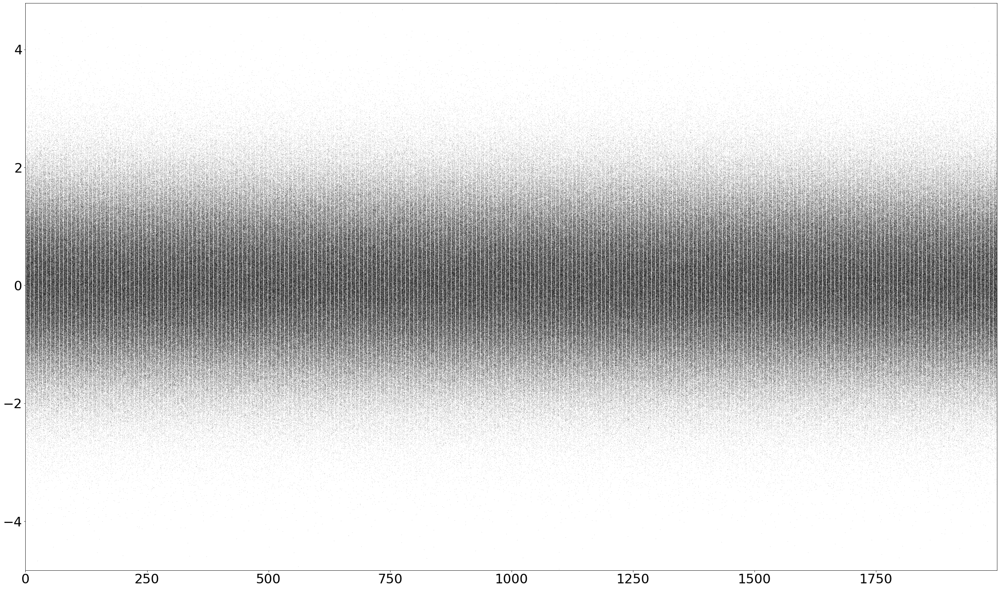

In [7]:
plt.rcParams["axes.xmargin"] = 0
plt.rcParams["axes.ymargin"] = 0
plt.rcParams["font.size"] = 30

fig, ax = plt.subplots(figsize = (40, 24))
monte_carlo_sim_df.plot.line(legend = False, ls = " ", marker=".", markersize = .2, 
                            color ="k", alpha = .5, ax = ax)

plt.show()

<ipython-input-8-d93dfd6ebd52>:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([str(int(y * 100)) + "%" for y in y_vals])


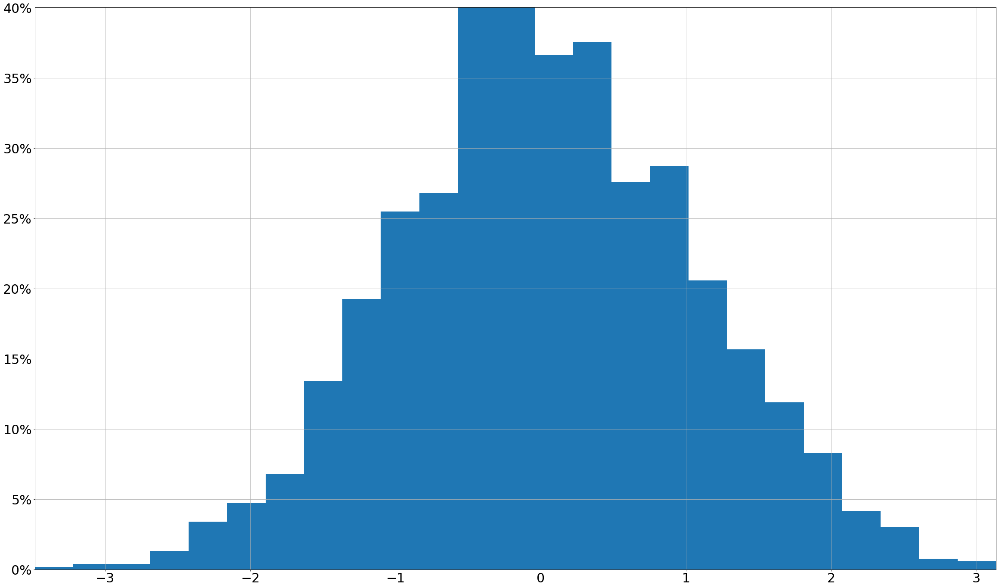

In [8]:
fig, ax = plt.subplots(figsize = (40, 24))
monte_carlo_sim_df.iloc[-1].hist(bins = 25, density = True,
                                ax = ax)

# set vertical axis values as percent
y_vals = ax.get_yticks()
ax.set_yticklabels([str(int(y * 100)) + "%" for y in y_vals])
plt.show()
plt.close()

## Monte Carlo with a Positive Trend

In [9]:
mean = .05
sigma = .5
monte_carlo_sim_dict = {}
num_sims = 2000
periods = 2000
index = np.arange(periods)
run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict, index)

monte_carlo_sim_df = pd.DataFrame(monte_carlo_sim_dict).cumsum()
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,-0.258377,-0.122588,0.034389,0.027913,-0.222646,-0.590574,-0.082220,-0.256032,0.536760,0.263144,...,-0.734689,-0.293995,-0.589435,0.213777,0.522089,0.358486,0.399268,0.123407,-0.207319,0.073434
1,-0.679679,-0.000076,0.051337,-0.965483,0.503219,-0.946173,0.470677,0.530174,0.479989,-0.925811,...,-1.732344,-0.962970,-0.834186,0.248328,0.744213,0.760923,1.252302,0.019071,1.138681,0.715634
2,-0.803602,-0.211788,0.160779,-0.560174,-0.204085,-1.409214,-0.435002,0.250939,-0.122649,-0.443995,...,-2.409745,-1.794194,-0.772523,1.556507,0.068811,0.032605,1.463026,0.326892,1.198759,1.828100
3,-0.798505,-0.284528,-0.241444,-0.026507,-0.583914,-1.051877,-0.277397,0.308877,-0.469056,-0.261524,...,-2.558312,-1.471748,0.177902,1.171373,-0.549584,-1.233877,1.368588,0.773667,1.144472,1.872729
4,-0.468759,0.014855,0.176197,0.981309,-0.512766,-0.921504,-0.742159,0.266816,-1.218352,0.043164,...,-2.465802,-1.127927,0.243520,0.025044,-0.383646,-1.419957,1.588204,1.320699,1.459813,1.264310
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,86.104966,95.030726,163.396550,98.393209,87.514745,113.884599,106.274367,87.926612,110.966447,68.380189,...,113.483143,92.208705,99.280198,66.324857,92.492764,145.502065,151.833472,100.340992,91.677964,101.210646
1996,87.084608,95.916653,163.357941,98.829512,88.303093,113.606924,106.163995,88.347099,111.352767,68.446835,...,112.813231,92.448049,98.971876,66.371953,92.907765,146.141693,152.767281,100.280254,92.149871,101.448930
1997,87.144559,96.346285,163.414006,99.284866,87.846477,114.038142,105.919721,88.778202,110.711451,68.454889,...,113.012994,93.202134,99.404011,66.242092,93.541895,146.094841,152.416163,99.700668,92.640750,101.785044
1998,87.427035,95.855398,162.738978,100.032998,87.348089,114.038952,106.140524,89.104526,109.904199,69.147386,...,113.563278,93.460481,99.388228,66.272588,93.933250,146.243189,152.781279,100.656659,91.964341,102.245150


In [10]:
def plot_monte_carlo_sim(sim_data,  title = None, logy = True):
    sim_data["mean"] = sim_data.mean(axis=1)
    fig, ax = plt.subplots(figsize = (40, 24))
    sim_data.drop("mean", inplace = False, axis = 1).plot.line(
            legend=False, marker =".", markersize = .1, color = "k", 
        alpha = .05, logy = logy, ax = ax)
    sim_data["mean"].plot.line(legend = False, color = "C3", 
                               linewidth = 5, logy = logy, ax = ax)
    
    
    plt.title(title, fontsize = 50)
    plt.show()
    plt.close()

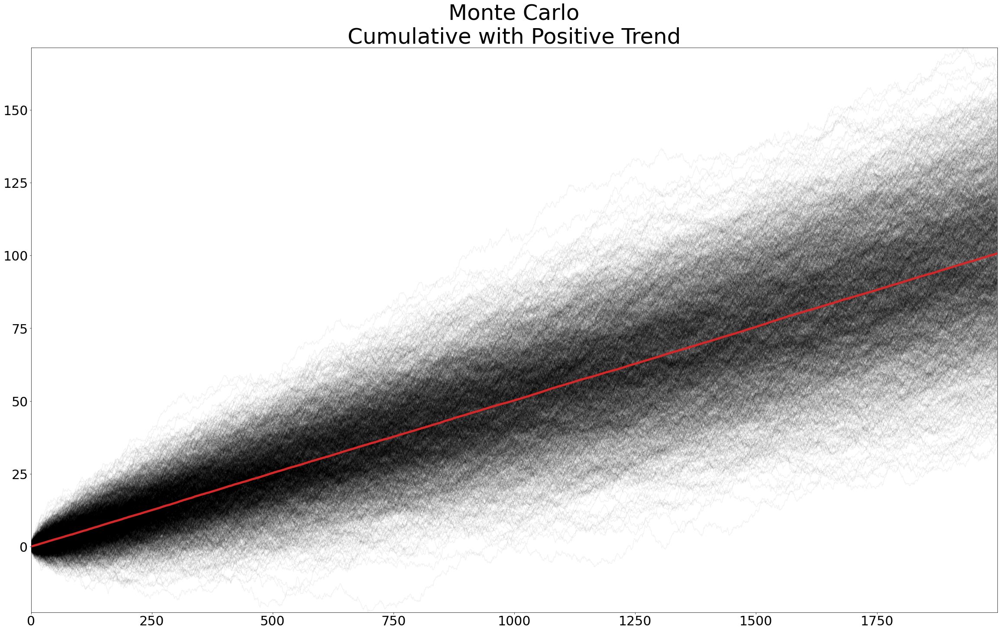

In [11]:
plot_monte_carlo_sim(monte_carlo_sim_df,  
    title = "Monte Carlo\nCumulative with Positive Trend", logy = False)


### Calculating Expected Value

In [12]:
monte_carlo_sim_df["mean"] = monte_carlo_sim_df.mean(axis = 1)
monte_carlo_sim_df["mean"]

0         0.046245
1         0.081739
2         0.130615
3         0.179066
4         0.220082
           ...    
1995    100.473453
1996    100.523272
1997    100.604450
1998    100.642818
1999    100.707316
Name: mean, Length: 2000, dtype: float64

### Simulating Changes in Portfolio Values

In [13]:
import pandas_datareader.data as web
import datetime

start = datetime.datetime(2005, 1, 1)
end = datetime.datetime.today()

data_dict = {}
stocks = "MSFT", "AAPL", "IBM", "GOOG"
for name in stocks:
    data_dict[name] = web.DataReader(name, "yahoo", start, end)

# make a list of the close data for each stock
close_data_dict = {key:val["Close"] for key, val in data_dict.items()}
close_data_df = pd.DataFrame(close_data_dict)

In [14]:
close_data_pct_change = close_data_df.pct_change()
close_data_pct_change

,MSFT,AAPL,IBM,GOOG
Date,,,,
2005-01-03,NaN,NaN,NaN,NaN
2005-01-04,0.003740,0.010270,-0.010742,-0.040501
2005-01-05,-0.002235,0.008758,-0.002068,-0.005090
2005-01-06,-0.001120,0.000775,-0.003109,-0.025632
2005-01-07,-0.002991,0.072811,-0.004366,0.028109
...,...,...,...,...
2021-11-22,-0.009560,0.002927,0.003619,-0.019166
2021-11-23,-0.006327,0.002422,0.002747,-0.002186
2021-11-24,0.000681,0.003284,-0.000514,-0.000269


In [15]:
close_data_normalized = close_data_pct_change.add(1).cumprod()
close_data_normalized.fillna(1, inplace =True)
close_data_normalized

,MSFT,AAPL,IBM,GOOG
Date,,,,
2005-01-03,1.000000,1.000000,1.000000,1.000000
2005-01-04,1.003740,1.010270,0.989258,0.959499
2005-01-05,1.001496,1.019118,0.987212,0.954615
2005-01-06,1.000374,1.019908,0.984143,0.930146
2005-01-07,0.997382,1.094169,0.979847,0.956292
...,...,...,...,...
2021-11-22,12.708676,142.473004,1.246318,29.131229
2021-11-23,12.628272,142.818082,1.249743,29.067549
2021-11-24,12.636874,143.287033,1.249101,29.059728


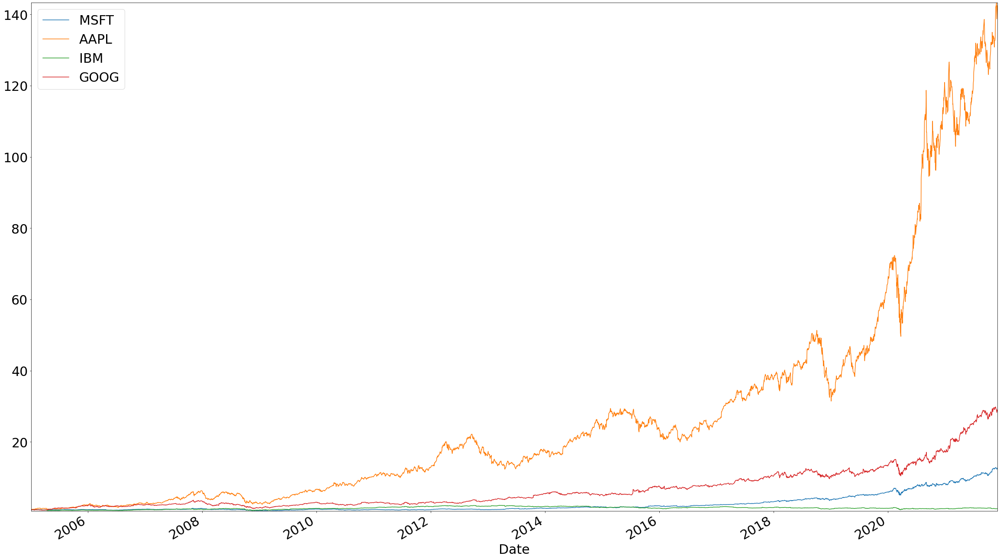

In [16]:
fig, ax = plt.subplots(figsize=(40,24))
close_data_normalized.plot.line(ax = ax)
plt.show()
plt.close()

### Daily Rate of Return

Derive the daily rate of return from the present value equation.

>$PV = \frac{FV}{(1 + r)^t}$
>
>Overall rate of return: $R=\frac{FV}{PV}$

Discount the overall rate of return to find the average rate of return. We will use this to define the mean of the standard normal distribution:

>$ r = (R)^{\frac{1}{t}} - 1$
>
>$t$ is measured in days

In [17]:
mean_var_df = pd.DataFrame(
    {"mean": close_data_normalized.iloc[-1].div(close_data_normalized.iloc[0]) ** (
        1 / close_data_normalized["MSFT"].count()) - 1, 
                            "sigma" : close_data_pct_change.std()})
mean_var_df

,mean,sigma
MSFT,0.000596,0.017060
AAPL,0.001166,0.020772
IBM,0.000057,0.014591
GOOG,0.000791,0.018619


In [18]:
num_sims = 500
dates = list(close_data_df.index)
monte_carlo_sim_dict = {}
for stock in stocks:
    monte_carlo_sim_dict[stock] = {}
    mean = mean_var_df["mean"][stock]
    sigma = mean_var_df["sigma"][stock]   
    run_monte_carlo(mean, 
                    sigma, 
                    num_sims, 
                    monte_carlo_sim_dict[stock], 
                    dates)
#    monte_carlo_sim_dict[stock] = pd.DataFrame(monte_carlo_sim_dict[stock]).add(1).cumprod()
monte_carlo_sim_dfs = {stock: pd.DataFrame(monte_carlo_sim_dict[stock]).add(1).cumprod() for stock in stocks}

In [19]:
monte_carlo_sim_dfs

{'MSFT':                   0          1          2         3         4         5    \
 2005-01-03   0.995917   1.000809   0.986659  1.016580  1.006193  1.011657   
 2005-01-04   1.016158   1.037040   0.996334  0.977143  1.004671  0.999079   
 2005-01-05   0.995298   1.012968   1.006100  0.996426  1.002668  0.993969   
 2005-01-06   1.016497   1.010860   1.020791  1.037845  1.019950  0.974530   
 2005-01-07   1.041408   1.002204   1.028912  1.022890  1.028706  0.975456   
 ...               ...        ...        ...       ...       ...       ...   
 2021-11-22  11.417333   9.699356  52.799948  1.646412  4.411174  1.537240   
 2021-11-23  10.875522   9.814532  53.608578  1.669034  4.402299  1.543620   
 2021-11-24  11.054243   9.859370  55.008397  1.669048  4.535673  1.534559   
 2021-11-26  10.953151   9.967670  55.472414  1.712075  4.504521  1.510509   
 2021-11-29  11.164168  10.012417  55.864594  1.662682  4.556993  1.528863   
 
                  6         7          8          9   

In [20]:
def plot_monte_carlo_sim(sim_data, 
                         observed_data = None, 
                         title = None, 
                         logy = True):
    sim_data["mean"] = sim_data.mean(axis=1)    
    index = sim_data.index
    fig, ax = plt.subplots(figsize = (40, 24))
    sim_data.drop(["mean"], inplace = False, axis = 1).plot.line(
            legend=False, marker =".",
        markersize = .1, 
        color = "k", 
        alpha = .05, 
        logy = logy, 
        ax = ax)
    if observed_data is not None:
        observed_data.plot.line(legend = False, 
                                color = "C2", 
                                linewidth = 5, 
                                logy = logy, 
                                ax = ax)
    
        # find x coordinate of lowest value observed
        obs_text_x = observed_data[observed_data == observed_data.min()].index
        plt.text(obs_text_x, observed_data.loc[obs_text_x] * .7,
                 "Observed", fontsize = 70, color = "C2")
    sim_data["mean"].plot.line(legend = False, color = "C3", 
                               linewidth = 5, logy = logy, ax = ax)
    plt.text(index[-400], sim_data["mean"].iloc[-400] * 1.5, "Exp\nVal",
            fontsize = 70, color = "C3")
   
    
    
    plt.title(title, fontsize = 50)
    plt.show()
    plt.close()

In [21]:
monte_carlo_sim_dfs[stock].median(axis = 1)

2005-01-03     0.999171
2005-01-04     1.000821
2005-01-05     1.003812
2005-01-06     1.004429
2005-01-07     1.002885
                ...    
2021-11-22    13.834313
2021-11-23    13.618779
2021-11-24    13.691297
2021-11-26    13.884151
2021-11-29    14.058926
Length: 4257, dtype: float64

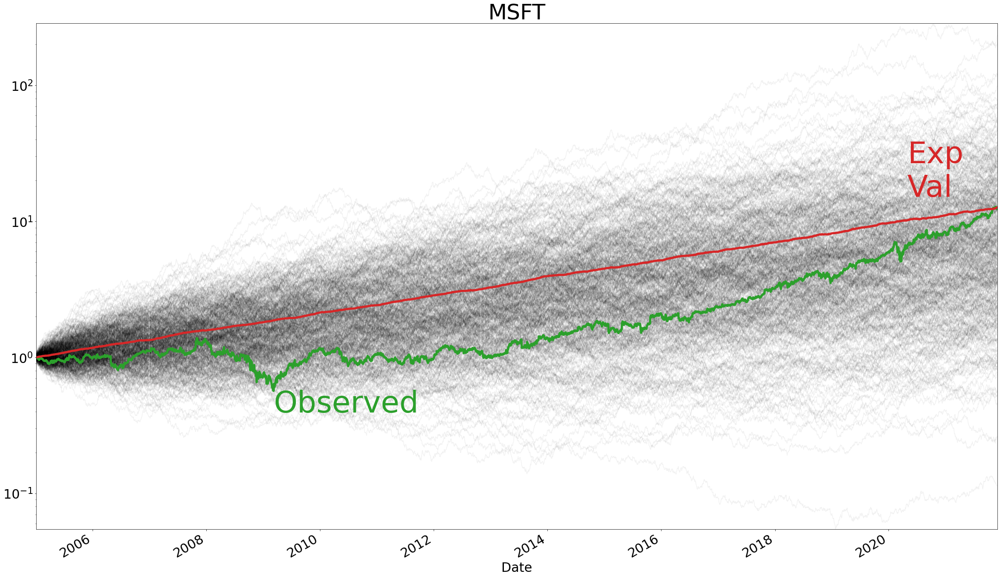

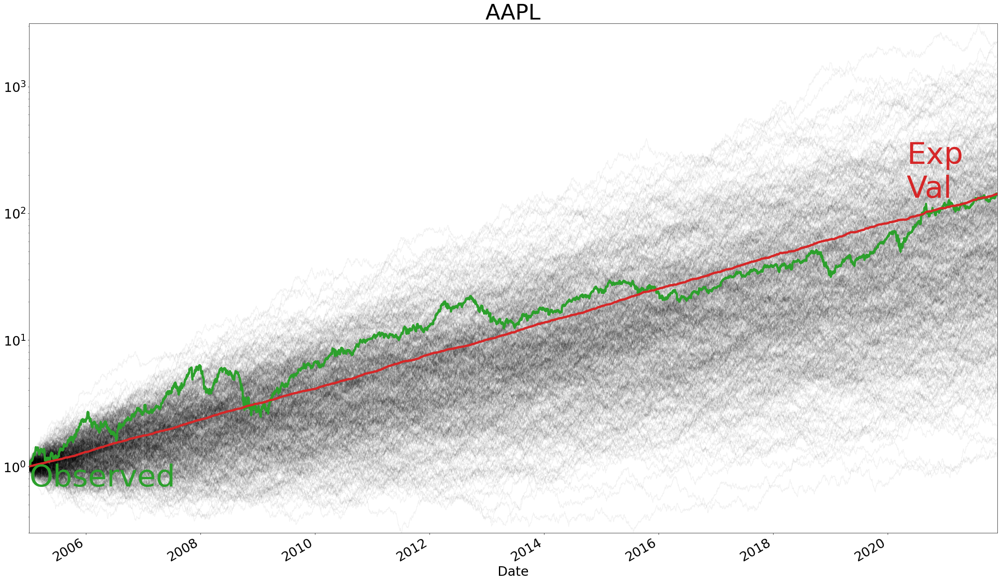

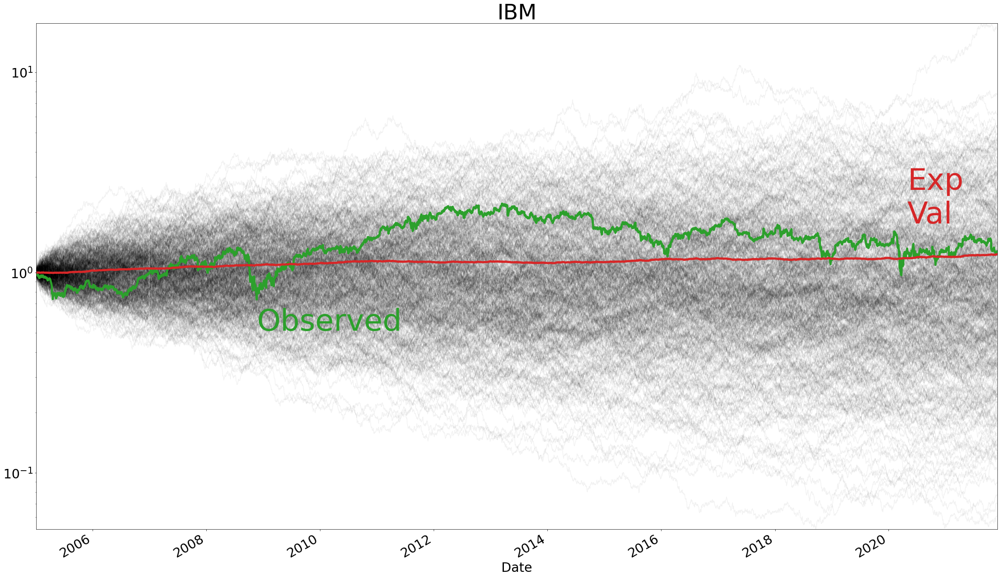

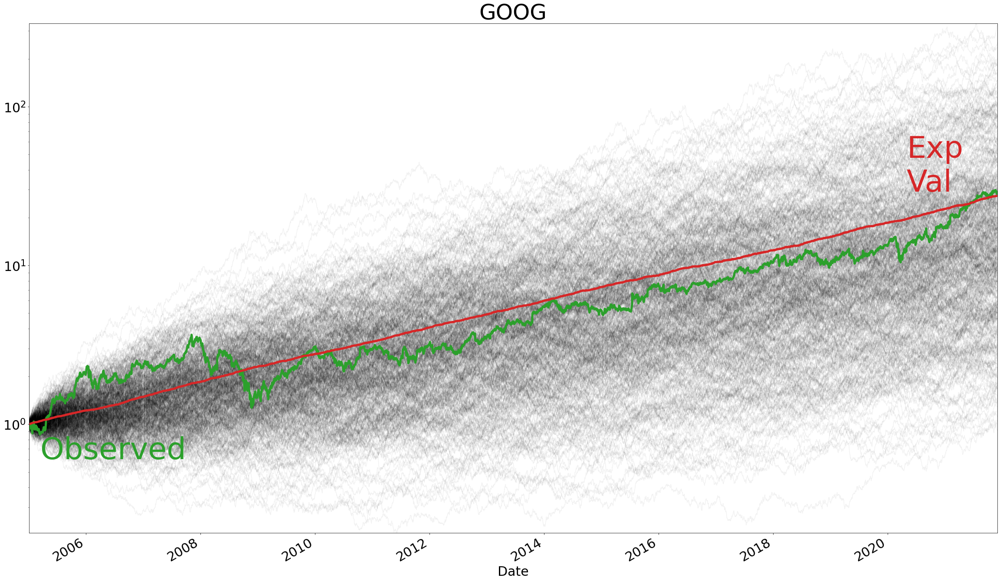

In [22]:
for stock in stocks:
    plot_monte_carlo_sim(monte_carlo_sim_dfs[stock], 
                         close_data_normalized[stock], 
                         stock, 
                         logy= True)


## Calculate Portfolio Return

In [23]:
portfolio_weights = {stock: 1 / len(stocks) for stock in stocks}
portfolio_weights

{'MSFT': 0.25, 'AAPL': 0.25, 'IBM': 0.25, 'GOOG': 0.25}

In [24]:
ex_return = pd.DataFrame(close_data_normalized.apply(lambda x :x.mul(portfolio_weights[x.name]),
                                                     axis = 0).sum(axis=1),
                                                    columns = ["Portfolio Return"])
close_data_normalized["Portfolio Return"] = ex_return
close_data_normalized

,MSFT,AAPL,IBM,GOOG,Portfolio Return
Date,,,,,
2005-01-03,1.000000,1.000000,1.000000,1.000000,1.000000
2005-01-04,1.003740,1.010270,0.989258,0.959499,0.990692
2005-01-05,1.001496,1.019118,0.987212,0.954615,0.990610
2005-01-06,1.000374,1.019908,0.984143,0.930146,0.983643
2005-01-07,0.997382,1.094169,0.979847,0.956292,1.006923
...,...,...,...,...,...
2021-11-22,12.708676,142.473004,1.246318,29.131229,46.389807
2021-11-23,12.628272,142.818082,1.249743,29.067549,46.440911
2021-11-24,12.636874,143.287033,1.249101,29.059728,46.558184


<AxesSubplot:xlabel='Date'>

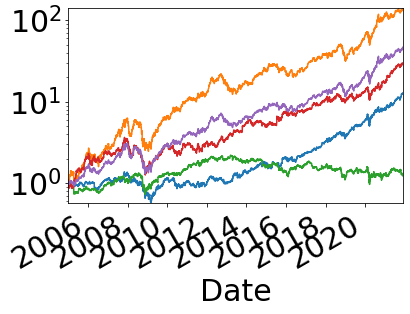

In [25]:
close_data_normalized.plot.line(legend=False, logy = True)

In [26]:
ex_return_pct_change = ex_return.pct_change()
ex_return_pct_change.dropna(inplace = True)
ex_return_pct_change

,Portfolio Return
Date,
2005-01-04,-0.009308
2005-01-05,-0.000082
2005-01-06,-0.007033
2005-01-07,0.023667
2005-01-10,0.001298
...,...
2021-11-22,-0.001461
2021-11-23,0.001102
2021-11-24,0.002525


In [27]:
mean_var_df = pd.DataFrame({"mean": (
    ex_return.iloc[-1] / ex_return.iloc[0]) **(
        1 / ex_return["Portfolio Return"].count()) -1,
                           "sigma" : ex_return_pct_change.std()})
mean_var_df

,mean,sigma
Portfolio Return,0.000902,0.016475


In [28]:
num_sims = 1000
dates = ex_return.index
monte_carlo_sim_dict = {}
mean = mean_var_df["mean"]["Portfolio Return"]
sigma = mean_var_df["sigma"]["Portfolio Return"]
run_monte_carlo(mean, 
                sigma, 
                num_sims, 
                monte_carlo_sim_dict, 
                dates)
monte_carlo_sim_df = pd.DataFrame(monte_carlo_sim_dict).add(1).cumprod()
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
2005-01-03,1.035974,0.964140,1.009666,0.977901,1.002125,1.006841,1.029869,1.018107,0.990356,0.970017,...,0.997919,0.993479,1.001694,1.020477,0.981360,1.011115,0.989664,1.017566,1.008060,0.990137
2005-01-04,1.058389,0.966183,1.013295,0.976763,0.994961,1.011600,1.047874,1.026107,1.000391,0.930700,...,1.004488,0.990006,0.967503,1.017433,0.997199,1.026293,0.972761,1.031357,0.995650,0.985570
2005-01-05,1.059352,0.982639,1.014652,1.003928,0.998056,1.003505,1.073815,1.012946,0.985656,0.935919,...,1.026547,0.986995,0.980198,1.022612,0.985339,1.014472,0.998786,1.023095,0.980011,1.001618
2005-01-06,1.072580,0.990791,0.998050,1.038839,0.972828,0.997700,1.094918,0.997037,0.969141,0.975608,...,1.019988,0.970125,0.961943,1.054842,1.021852,1.021130,0.998843,1.046574,1.001776,1.028354
2005-01-07,1.057378,0.994061,0.981275,1.024170,0.954800,1.005385,1.091885,1.029320,0.990477,0.989245,...,1.030035,0.967647,0.989539,1.054047,1.024085,1.027138,0.997921,1.036590,1.004746,1.020032
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-22,232.719302,3.614767,11.396140,22.536774,68.377939,20.150269,68.623854,159.652815,8.686297,84.783598,...,99.178642,13.337382,18.446876,33.088986,50.364499,6.760207,93.187452,7.585139,65.866053,41.420945
2021-11-23,236.237724,3.625720,11.409077,23.025071,68.020300,20.091153,67.813194,156.628659,8.894437,84.603021,...,98.752214,13.299505,18.347919,32.632729,50.525172,6.682440,96.671294,7.348253,65.741075,42.792909
2021-11-24,233.968884,3.669739,11.271193,22.717631,67.786745,19.974936,67.165092,158.771447,8.834958,86.166834,...,99.116861,13.394172,18.161529,32.825281,50.525653,6.687008,98.003808,7.357823,66.081479,41.993599
2021-11-26,231.986375,3.685838,11.380834,22.680855,65.911042,19.811358,68.035157,156.256800,8.552882,86.557890,...,97.006840,13.407847,18.173430,32.898573,50.446120,6.705195,101.167696,7.053585,68.182570,41.972194


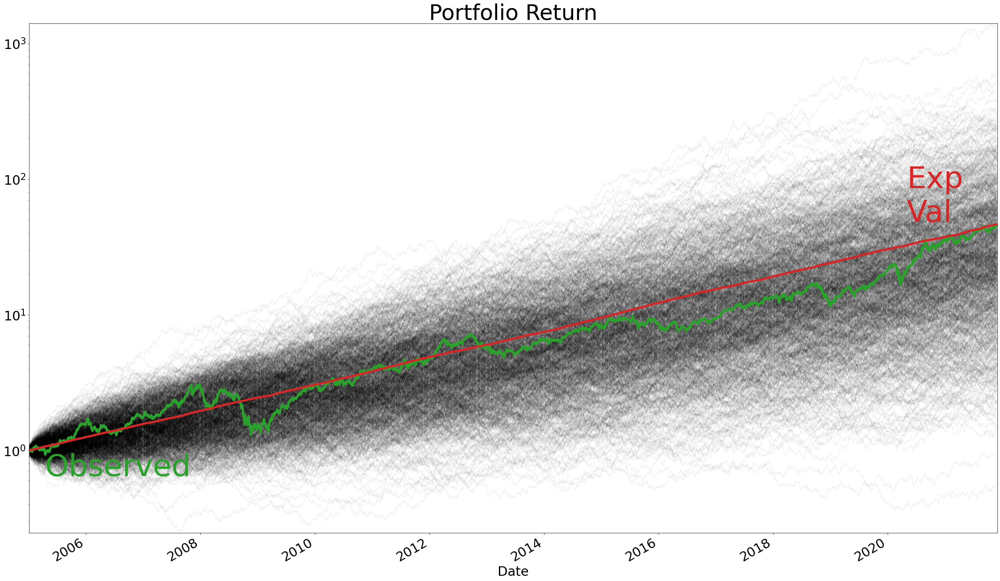

In [29]:
plot_monte_carlo_sim(monte_carlo_sim_df, 
                     ex_return["Portfolio Return"], 
                     "Portfolio Return", 
                     logy= True)